<a href="https://colab.research.google.com/github/abhishtagatya/paintgan-model-comparison/blob/main/gatys_et_al.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Gatys et al. NST

In fine art, especially painting, humans have mastered the skill to create unique visual experiences through composing a complex interplay between the content and style of an image. Thus far the algorithmic basis of this process is
unknown and there exists no artificial system with similar capabilities. However, in other key areas of visual perception such as object and face recognition
near-human performance was recently demonstrated by a class of biologically inspired vision models called Deep Neural Networks.

[Paper : A Neural Algorithm of Artistic Style](https://arxiv.org/abs/1508.06576)

### Dataset

```
PaintGAN 80K
Just a sliced dataset of Places365 and WikiArt each containing roughly 80,000 content and style images each.
```







### Prelimenary Setup

Setting up and loading dataset from PaintGAN 80K using Tensorflow DataLoader

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip drive/MyDrive/Dataset/paintgan-80k.zip

Streaming output truncated to the last 5000 lines.
  inflating: paintgan-dataset/wikiart/Realism-vincent-van-gogh_houses-with-thatched-roofs-1884.jpg  
  inflating: paintgan-dataset/wikiart/Cubism-nzante-spee_the-wahdoosee-question-1994.jpg  
  inflating: paintgan-dataset/wikiart/Art_Nouveau_Modern-koloman-moser_postcard-to-carl-moll-ver-sacrum-1897.jpg  
  inflating: paintgan-dataset/wikiart/Realism-pyotr-konchalovsky_daisies-1935-1.jpg  
  inflating: paintgan-dataset/wikiart/Northern_Renaissance-albrecht-durer_head-of-an-old-man-in-profile.jpg  
  inflating: paintgan-dataset/wikiart/Northern_Renaissance-albrecht-durer_lion.jpg  
  inflating: paintgan-dataset/wikiart/Impressionism-theo-van-rysselberghe_standing-nude-1919.jpg  
  inflating: paintgan-dataset/wikiart/Post_Impressionism-henri-de-toulouse-lautrec_not_detected_230533-1882.jpg  
  inflating: paintgan-dataset/wikiart/Impressionism-joaquã­n-sorolla_orchard-house-valencia-study-1908.jpg  
  inflating: paintgan-dataset/wikiart/E

In [30]:
import os
import glob
import random
import imageio
import numpy as np
from tqdm import tqdm
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

#@title ## Model Training Parameters { display-mode: "both" }
#@markdown Change training parameters based on experimentation

# Defining Training Parameters
MODEL_NAME = "Gatys" #@param{type:"string"}
IMAGE_SIZE = (256, 256) #@param{type:"raw"}
EPOCHS = 30 #@param{type:"integer"}
STEPS_PER_EPOCH = 100 #@param{type:"integer"}
CHECKPOINT_PER_EPOCH = 5 #@param{type:"integer"}

AUTOTUNE = tf.data.AUTOTUNE

WIKIART_BASEPATH = "paintgan-dataset/wikiart"
P365_BASEPATH = "paintgan-dataset/places365"

# Loading Image path
content_images = os.listdir(P365_BASEPATH)
content_images = [os.path.join(P365_BASEPATH, path) for path in content_images]

style_images = os.listdir(WIKIART_BASEPATH)
style_images = [os.path.join(WIKIART_BASEPATH, path) for path in style_images]

In [31]:
# Removing corrupted JPEGs on Unzip process (if any)

from struct import unpack

marker_mapping = {
    0xffd8: "Start of Image",
    0xffe0: "Application Default Header",
    0xffdb: "Quantization Table",
    0xffc0: "Start of Frame",
    0xffc4: "Define Huffman Table",
    0xffda: "Start of Scan",
    0xffd9: "End of Image"
}

class JPEG:

    def __init__(self, image_file):
        with open(image_file, 'rb') as f:
            self.img_data = f.read()
    
    def decode(self):
        data = self.img_data
        while(True):
            marker, = unpack(">H", data[0:2])
            if marker == 0xffd8:
                data = data[2:]
            elif marker == 0xffd9:
                return
            elif marker == 0xffda:
                data = data[-2:]
            else:
                lenchunk, = unpack(">H", data[2:4])
                data = data[2+lenchunk:]            
            if len(data)==0:
                break        


corrupted = []

for img in tqdm(style_images):
  image = JPEG(img) 
  try:
    image.decode()   
  except:
    corrupted.append(img)

for name in corrupted:
  style_images.remove(name)

100%|██████████| 80000/80000 [05:45<00:00, 231.68it/s]


In [32]:
# Image Preprocessing
def preprocess_image(image_path, size=IMAGE_SIZE):
  """
    Preprocess the image by decoding and resizing and image 
    from the image file path.

    Args:
      image_path: The image file path.
      size: The size of the image to be resized to.

    Returns:
      image: resized image
  """

  max_dim = size[0]

  image = tf.io.read_file(image_path)
  image = tf.image.decode_image(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)

  shape = tf.cast(tf.shape(image)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  image = tf.image.resize(image, new_shape)
  image = image[tf.newaxis, :]
  return image


# PSPM Data Loader
# Choosing random image
content_image = preprocess_image(random.choice(content_images))
style_image = preprocess_image(random.choice(style_images))

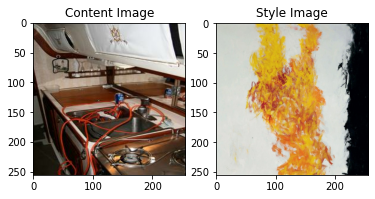

In [33]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

### Monitors and Callbacks

Creating custom monitors and callbacks to be called on_epoch_end

In [34]:
test_style, test_content = next(iter(test_ds))

class DisplayMonitor(tf.keras.callbacks.Callback):

  def on_epoch_end(self, epoch, logs=None):
    # Encode the style and content image
    pass

    # Plot the style, content, image
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
    ax[0].imshow(tf.keras.preprocessing.image.array_to_img(test_style[0]))
    ax[0].set_title(f"Style: {epoch+1:03d}")

    ax[1].imshow(tf.keras.preprocessing.image.array_to_img(test_content[0]))
    ax[1].set_title(f"Content: {epoch+1:03d}")

    ax[2].imshow(tf.keras.preprocessing.image.array_to_img(test_recon_image[0]))
    ax[2].set_title(f"{MODEL_NAME}: {epoch+1:03d}")

    plt.show()
    plt.close()

NameError: ignored

In [ ]:
!mkdir model_checkpoints

In [ ]:
class CheckpointMonitor(tf.keras.callbacks.Callback):

  def on_epoch_end(self, epoch, logs=None):
    # Saving model checkpoint
    if (epoch+1) % CHECKPOINT_PER_EPOCH == 0:
      self.model.save_weights(f'model_checkpoints/{MODEL_NAME}_{epoch+1}.ckpt')

In [ ]:
csv_logger = keras.callbacks.CSVLogger(f'{MODEL_NAME}_p365-{EPOCHS}-{BATCH_SIZE}.csv', append=True, separator=';')

In [ ]:
callbacks = [
  DisplayMonitor(),
  CheckpointMonitor(),
  csv_logger
]

### Model Implementation

In [35]:
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [36]:
def vgg_layers(layer_names):
  """ Creates a vgg model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

In [37]:
# Calculate the style

def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result / (num_locations)

In [38]:
class StyleContentExtractor(tf.keras.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentExtractor, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)

    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input [0, 1]"
    inputs = inputs * 255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])
    
    # Applying gram matrix to style_output
    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}


In [39]:
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

#### Loss Function

In [40]:
extractor = StyleContentExtractor(style_layers, content_layers)

style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

def style_loss_fn(style_outputs, style_weight=1e-2):
  loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name])**2) 
                           for name in style_outputs.keys()])
  loss *= style_weight / num_style_layers
  return loss

def content_loss_fn(content_outputs, content_weight=1e4):
  loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
  loss *= content_weight / num_content_layers
  return loss

#### Training

In [45]:
optimizer = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

train_style_loss_metric = keras.metrics.Mean(name="style_loss")
train_content_loss_metric = keras.metrics.Mean(name="content_loss")
train_total_loss_metric = keras.metrics.Mean(name="total_loss")

@tf.function()
def train_step(image, total_variation_weight=30):
  with tf.GradientTape() as tape:
    outputs = extractor(image)

    style_outputs = outputs['style']
    content_outputs = outputs['content']

    style_loss = style_loss_fn(style_outputs)
    content_loss = content_loss_fn(content_outputs)

    total_loss = style_loss + content_loss
    total_loss += total_variation_weight * tf.image.total_variation(image)

  print(style_loss, content_loss, total_loss)
  
  gradients = tape.gradient(total_loss, image)
  optimizer.apply_gradients([(gradients, image)])

  image.assign(clip_0_1(image))

  train_style_loss_metric.update_state(style_loss)
  train_content_loss_metric.update_state(content_loss)
  train_total_loss_metric.update_state(total_loss) 

  return {
      "style_loss": train_style_loss_metric.result(),
      "content_loss": train_content_loss_metric.result(),
      "total_loss": train_total_loss_metric.result()
  }


Epoch 1/30
Tensor("mul:0", shape=(), dtype=float32) Tensor("mul_1:0", shape=(), dtype=float32) Tensor("add_1:0", shape=(1,), dtype=float32)
Tensor("mul:0", shape=(), dtype=float32) Tensor("mul_1:0", shape=(), dtype=float32) Tensor("add_1:0", shape=(1,), dtype=float32)
100/100 [==============================] - 3s 14ms/step - style_loss: 38388832.0000 - content_loss: 20280710.0000 - total_loss: 59762560.0000


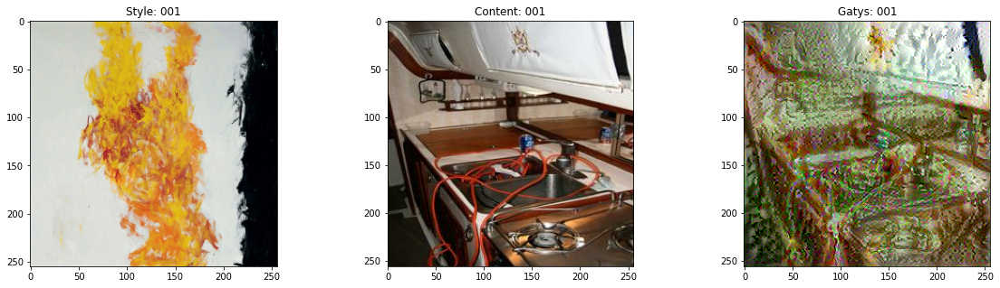


Epoch 2/30
100/100 [==============================] - 1s 12ms/step - style_loss: 12958216.0000 - content_loss: 13103549.0000 - total_loss: 27231248.0000


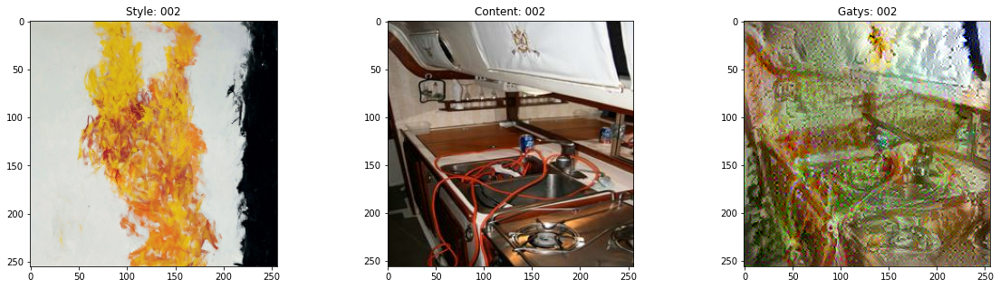


Epoch 3/30
100/100 [==============================] - 1s 10ms/step - style_loss: 8331444.5000 - content_loss: 10081165.0000 - total_loss: 19488486.0000


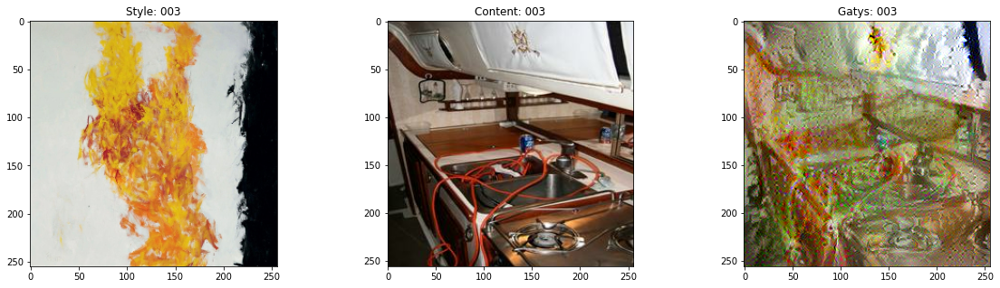


Epoch 4/30
100/100 [==============================] - 1s 11ms/step - style_loss: 6496995.0000 - content_loss: 8548000.0000 - total_loss: 16013743.0000


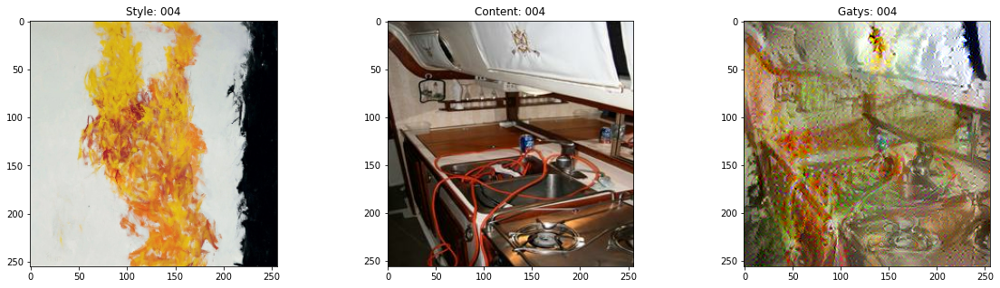


Epoch 5/30
100/100 [==============================] - 1s 11ms/step - style_loss: 5589213.0000 - content_loss: 7725718.5000 - total_loss: 14178019.0000


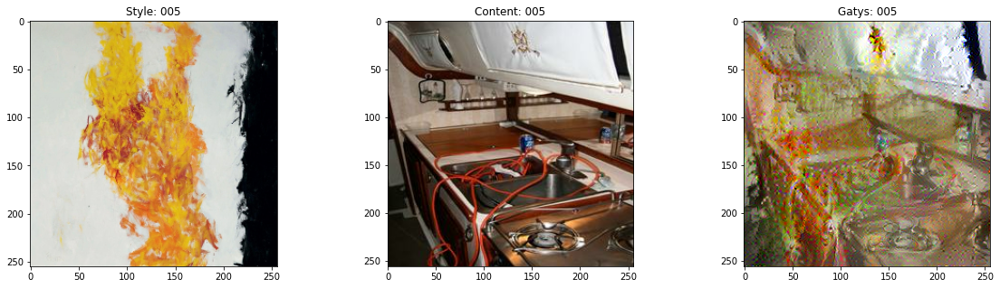


Epoch 6/30
100/100 [==============================] - 1s 11ms/step - style_loss: 5037929.5000 - content_loss: 7227570.0000 - total_loss: 13036922.0000


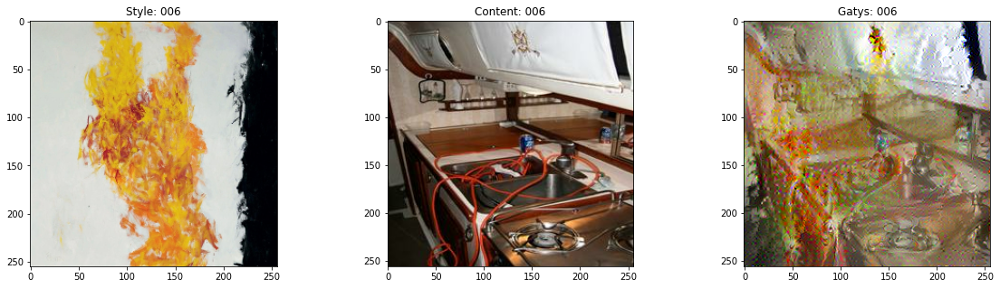


Epoch 7/30
100/100 [==============================] - 1s 11ms/step - style_loss: 4692206.0000 - content_loss: 6893253.0000 - total_loss: 12286862.0000


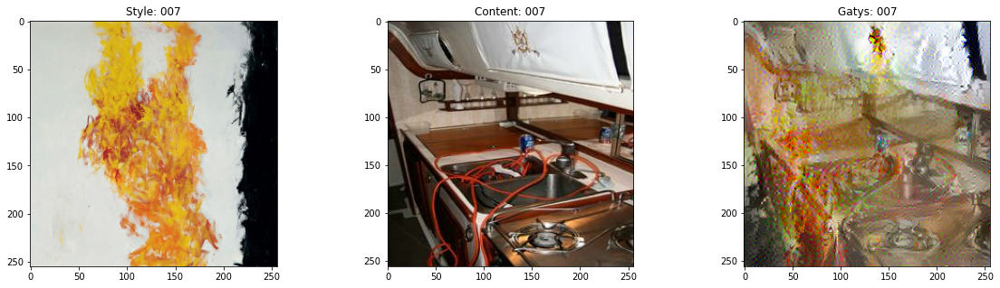


Epoch 8/30
100/100 [==============================] - 1s 10ms/step - style_loss: 4458295.0000 - content_loss: 6669737.0000 - total_loss: 11776820.0000


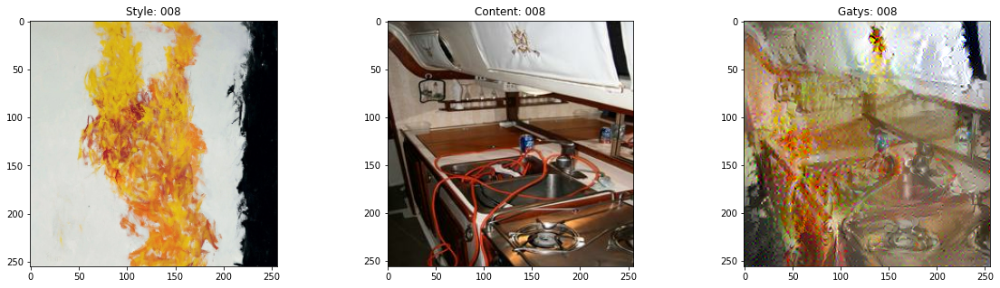


Epoch 9/30
100/100 [==============================] - 1s 11ms/step - style_loss: 4285361.0000 - content_loss: 6511336.5000 - total_loss: 11406542.0000


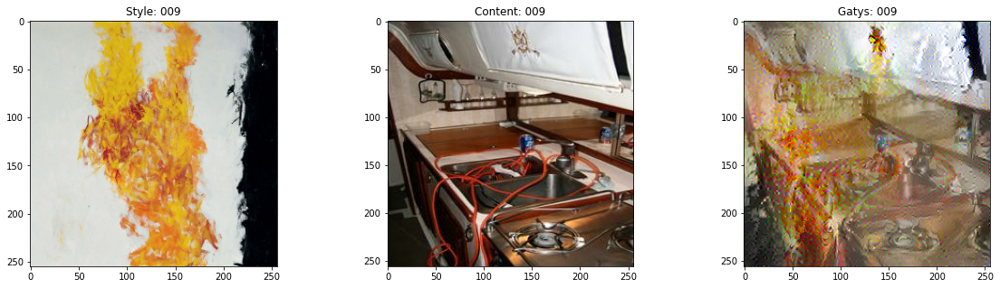


Epoch 10/30
100/100 [==============================] - 1s 10ms/step - style_loss: 4155324.5000 - content_loss: 6400995.0000 - total_loss: 11136343.0000


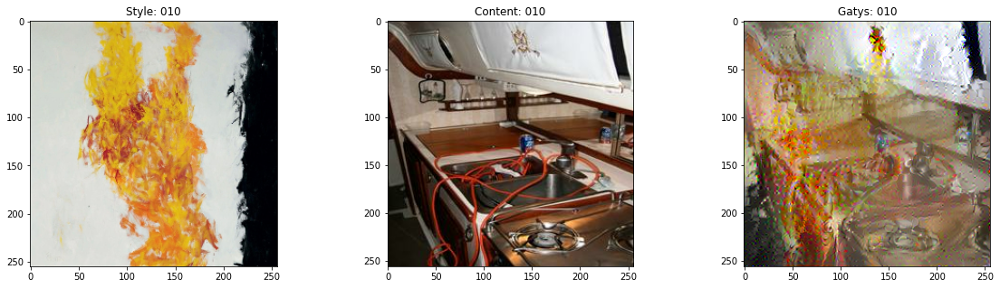


Epoch 11/30
100/100 [==============================] - 1s 11ms/step - style_loss: 4057789.5000 - content_loss: 6319158.5000 - total_loss: 10934223.0000


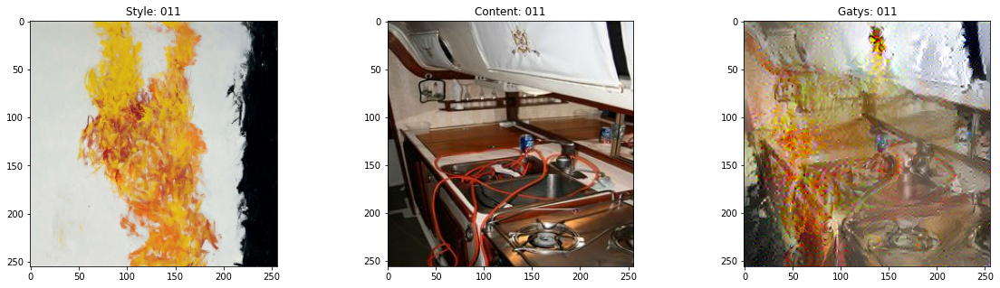


Epoch 12/30
100/100 [==============================] - 1s 10ms/step - style_loss: 3978861.0000 - content_loss: 6252662.0000 - total_loss: 10771767.0000


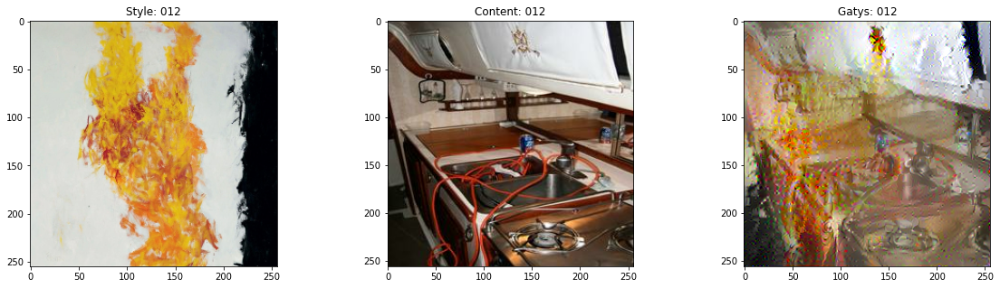


Epoch 13/30
100/100 [==============================] - 1s 11ms/step - style_loss: 3917526.5000 - content_loss: 6197331.0000 - total_loss: 10641674.0000


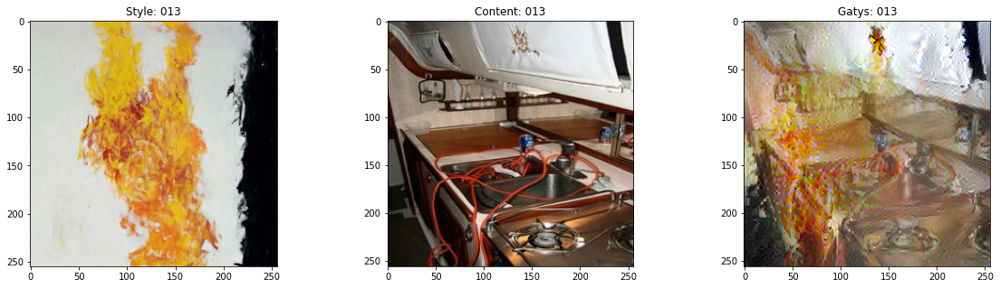


Epoch 14/30
100/100 [==============================] - 1s 10ms/step - style_loss: 3869623.0000 - content_loss: 6150294.0000 - total_loss: 10536180.0000


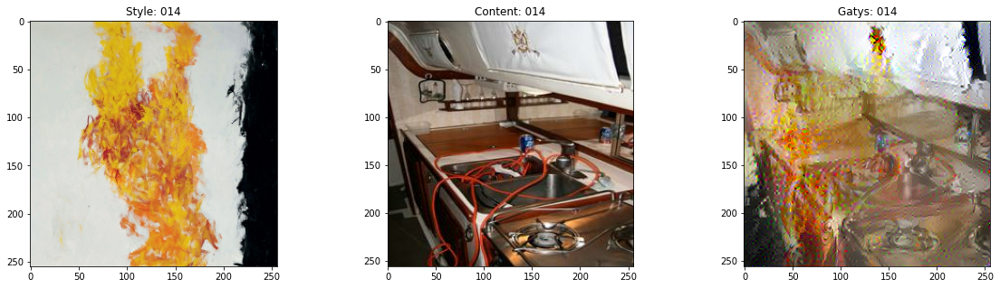


Epoch 15/30
100/100 [==============================] - 1s 10ms/step - style_loss: 3834071.2500 - content_loss: 6111136.5000 - total_loss: 10452801.0000


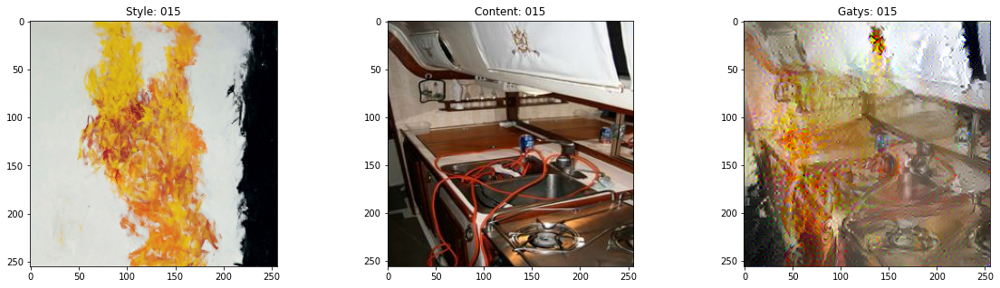


Epoch 16/30
100/100 [==============================] - 1s 11ms/step - style_loss: 3805138.0000 - content_loss: 6073063.0000 - total_loss: 10379062.0000


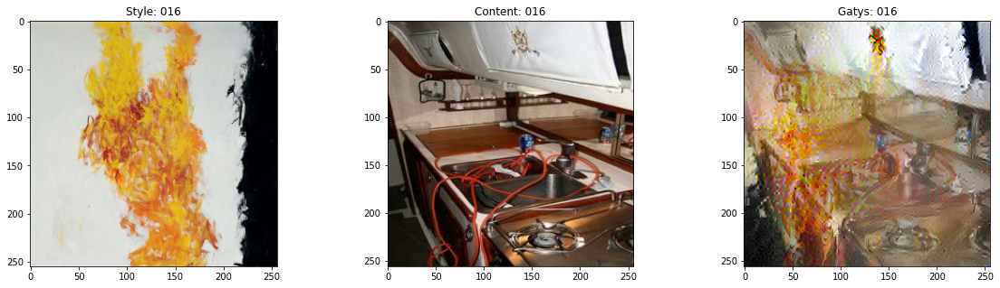


Epoch 17/30
100/100 [==============================] - 1s 10ms/step - style_loss: 3777829.0000 - content_loss: 6038477.5000 - total_loss: 10312810.0000


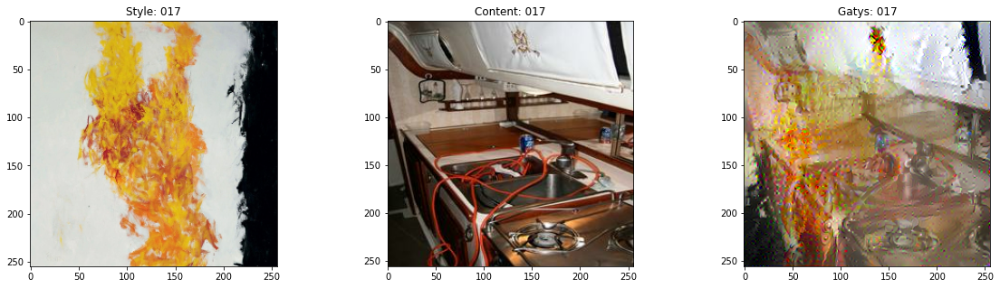


Epoch 18/30
100/100 [==============================] - 1s 10ms/step - style_loss: 3749453.5000 - content_loss: 6012434.5000 - total_loss: 10255155.0000


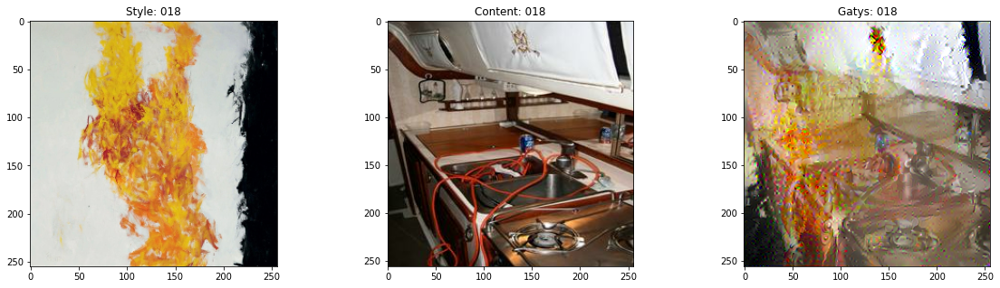


Epoch 19/30
100/100 [==============================] - 1s 11ms/step - style_loss: 3724483.5000 - content_loss: 5990686.0000 - total_loss: 10205136.0000


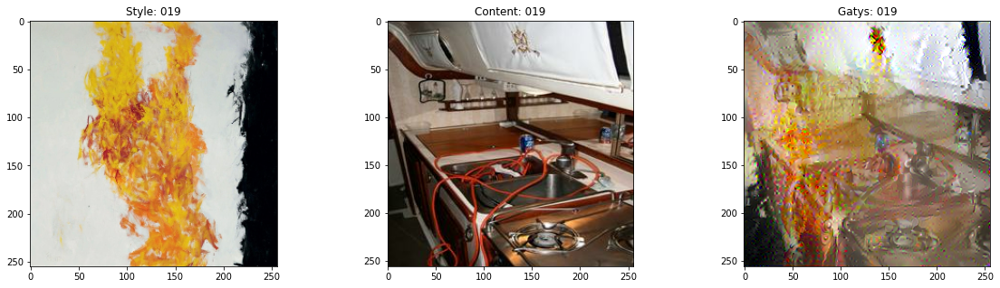


Epoch 20/30
100/100 [==============================] - 1s 10ms/step - style_loss: 3699679.2500 - content_loss: 5974198.5000 - total_loss: 10161265.0000


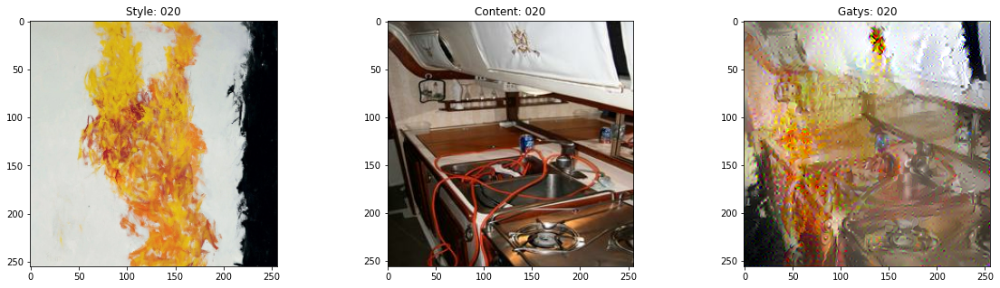


Epoch 21/30
100/100 [==============================] - 1s 9ms/step - style_loss: 3679323.5000 - content_loss: 5959174.5000 - total_loss: 10123637.0000


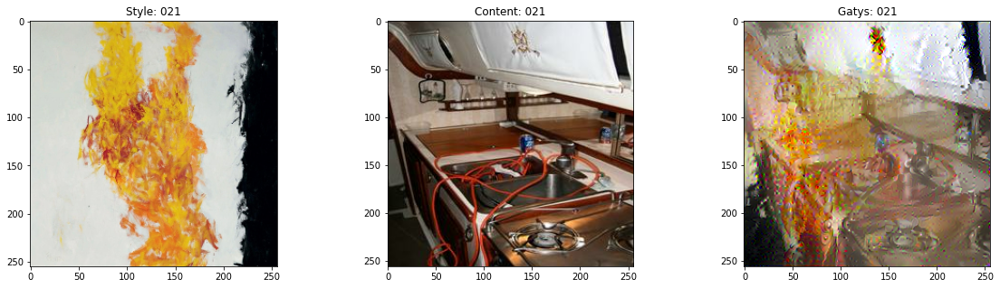


Epoch 22/30
100/100 [==============================] - 1s 11ms/step - style_loss: 3660003.5000 - content_loss: 5949282.5000 - total_loss: 10092395.0000


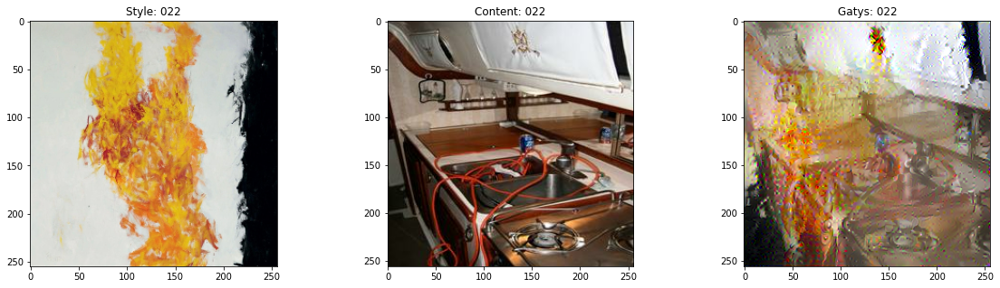


Epoch 23/30
100/100 [==============================] - 1s 10ms/step - style_loss: 3647005.0000 - content_loss: 5939287.5000 - total_loss: 10067090.0000


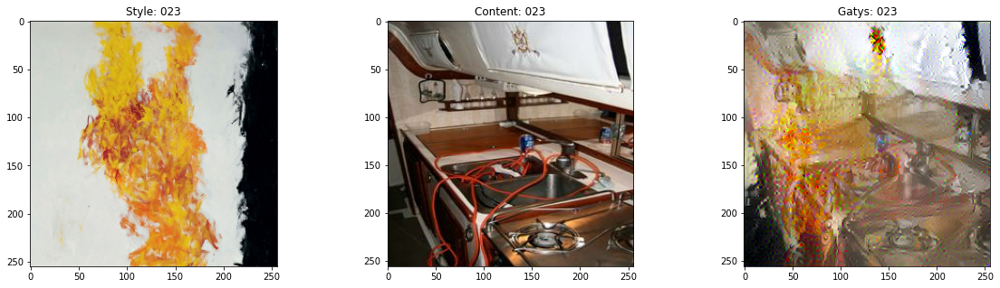


Epoch 24/30
100/100 [==============================] - 1s 11ms/step - style_loss: 3635426.0000 - content_loss: 5930988.0000 - total_loss: 10045089.0000


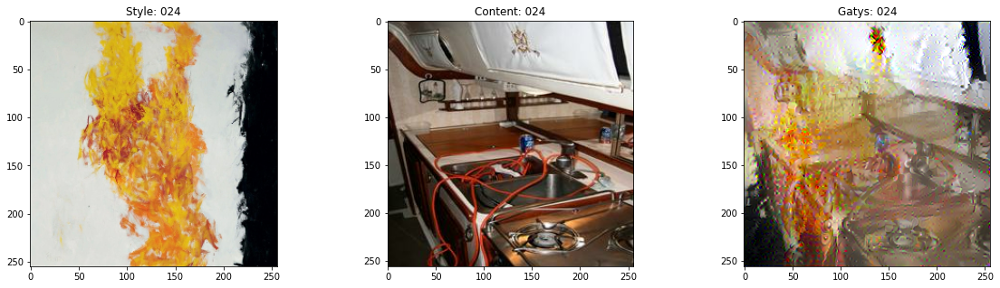


Epoch 25/30
100/100 [==============================] - 1s 11ms/step - style_loss: 3624056.2500 - content_loss: 5924811.0000 - total_loss: 10025980.0000


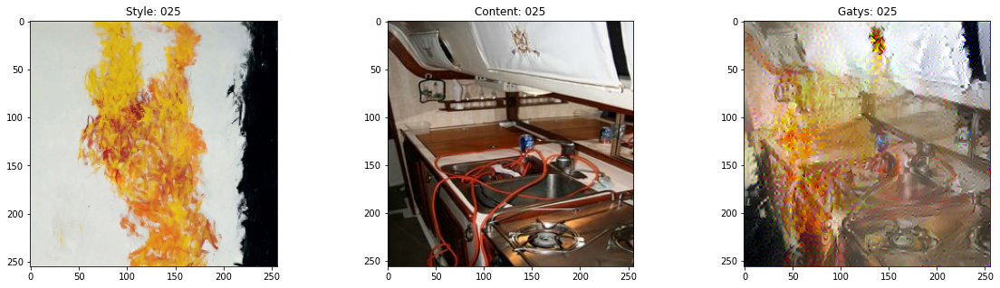


Epoch 26/30
100/100 [==============================] - 1s 11ms/step - style_loss: 3613827.2500 - content_loss: 5914873.5000 - total_loss: 10005337.0000


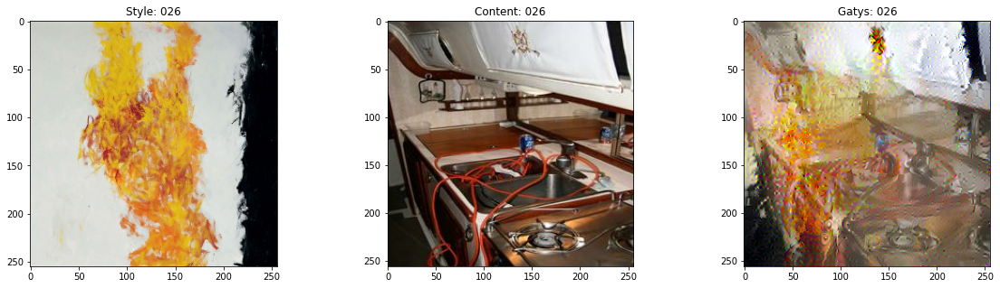


Epoch 27/30
100/100 [==============================] - 1s 10ms/step - style_loss: 3602834.5000 - content_loss: 5903024.5000 - total_loss: 9981975.0000


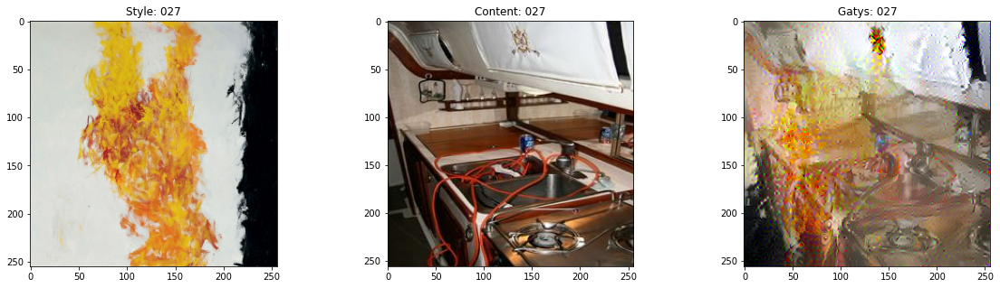


Epoch 28/30
100/100 [==============================] - 1s 10ms/step - style_loss: 3592819.0000 - content_loss: 5892289.5000 - total_loss: 9960462.0000


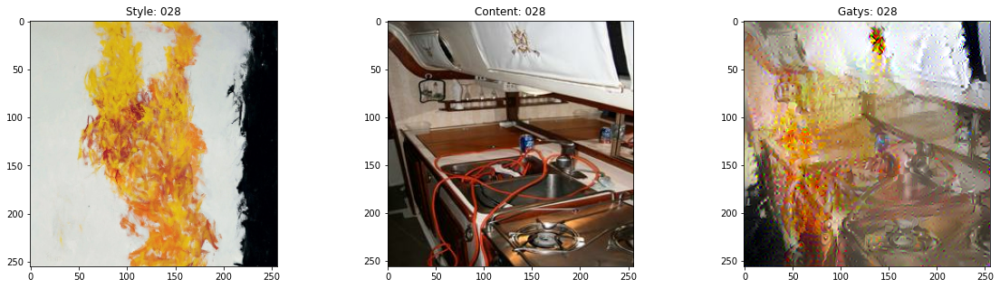


Epoch 29/30
100/100 [==============================] - 1s 10ms/step - style_loss: 3580781.0000 - content_loss: 5883524.5000 - total_loss: 9939166.0000


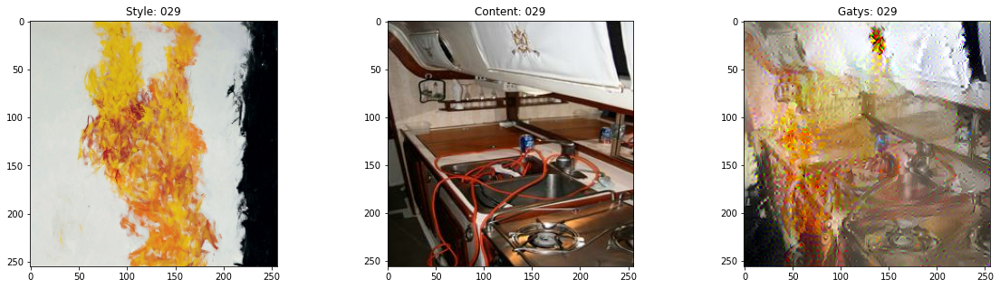


Epoch 30/30
100/100 [==============================] - 1s 11ms/step - style_loss: 3572710.5000 - content_loss: 5874715.5000 - total_loss: 9921506.0000


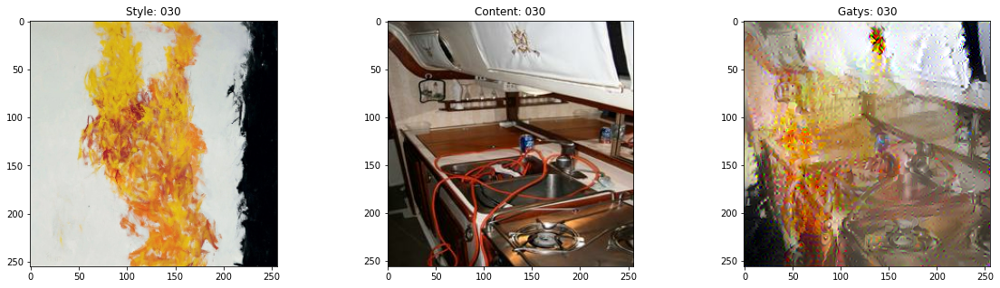

In [46]:
from tensorflow.keras.utils import Progbar
from PIL import Image

image = tf.Variable(content_image)

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return Image.fromarray(tensor)

for epoch in range(EPOCHS):

  print(f'\nEpoch {epoch+1}/{EPOCHS}')
  pb_i = Progbar(STEPS_PER_EPOCH, stateful_metrics=[
    'style_loss', 'content_loss', 'total_loss'
  ])

  for steps in range(STEPS_PER_EPOCH):
    train_step(image)
    metric_values = [
      ('style_loss', train_style_loss_metric.result()),
      ('content_loss', train_content_loss_metric.result()),
      ('total_loss', train_total_loss_metric.result())
    ]
    pb_i.add(1, values=metric_values)

  
  train_style_loss_metric.reset_states()
  train_content_loss_metric.reset_states()
  train_total_loss_metric.reset_states()

  # Train Monitors
  fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
  ax[0].imshow(tf.squeeze(style_image, axis=0))
  ax[0].set_title(f"Style: {epoch+1:03d}")

  ax[1].imshow(tf.squeeze(content_image, axis=0))
  ax[1].set_title(f"Content: {epoch+1:03d}")

  ax[2].imshow(tf.squeeze(image, axis=0))
  ax[2].set_title(f"{MODEL_NAME}: {epoch+1:03d}")

  plt.savefig(f'model_results/{MODEL_NAME}_{epoch+1}.png', format='png')
  plt.show()


In [16]:
### Wrapping entire model (if we can)

16757763.0000
14751245.0000
13385524.0000
12381018.0000

### Result

In [47]:
import glob
from PIL import Image

fpath = "model_results/{MODEL_NAME}_{EPOCH}.png"
fout = f"{MODEL_NAME}_{EPOCHS}.gif"

imgs = []
for i in range(EPOCHS):
  imgs.append(Image.open(fpath.format(MODEL_NAME=MODEL_NAME, EPOCH=i+1)))

imgs = iter(imgs)
img = next(imgs)
img.save(fp=fout, format='GIF', append_images=imgs,
         save_all=True, duration=200, loop=0)